# Scoring Legend Extraction
This notebook is dedicated to the scoring portion of extracting legends and how best that is accomplished.

In [1]:
import os
import cv2
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patheffects as fx

In [8]:
# Load a USGS formated json file
def loadUSGSJson(filename, polyDataOnly=False):
    with open(filename, 'r') as fh:
        json_data = json.load(fh)

    if polyDataOnly:
        json_data['shapes'] = [s for s in json_data['shapes'] if s['label'].split('_')[-1] == 'poly']

    # Convert pix coords to int
    for feature in json_data['shapes']:
        feature['points'] = np.array(feature['points']).astype(int)

    return json_data

def trimBBoxPadding(contour, img):
    # Find the bounding rect of the contour
    min_xy = [min(contour, key=lambda x: (x[0]))[0], min(contour, key=lambda x: (x[1]))[1]]
    max_xy = [max(contour, key=lambda x: (x[0]))[0], max(contour, key=lambda x: (x[1]))[1]]
    mask = img[min_xy[1]:max_xy[1], min_xy[0]:max_xy[0], :].copy()

    grayMask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
    _, binaryMask = cv2.threshold(grayMask, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Flood fill borders
    height, width = binaryMask.shape[:2]
    corners = [[0,0],[0,height-1],[width-1, 0],[width-1, height-1]]
    for c in corners:
        cv2.floodFill(binaryMask, None, (c[0],c[1]), 0)

    x, y, w, h = cv2.boundingRect(cv2.findNonZero(binaryMask))
    return [[x,y],[x+w,y+h]] + contour[0]

In [9]:
truth_json = loadUSGSJson('AZ_Flagstaff.json', polyDataOnly=True)
predict_json = loadUSGSJson('AZ_Flagstaff_predict.json', polyDataOnly=True)

img_filename = 'AZ_Flagstaff.tif'
img = cv2.imread(img_filename)

In [10]:
CORRECT_OVERLAP_THRESHOLD = 0.25
# Output effects
BORDER_THICKNESS = 5
CORRECT_COLOR = (0,255,0) # Green
DIFF_COLOR = (47,255,173) # Green-Yellow
OCR_COLOR = (0,255,255) # Yellow
FAIL_COLOR = (0,0,255) # Red
MISS_COLOR = (255,0,255) # Fuchsia

# Save an image of a predicted contour
def saveContour(image, contour, filename, pad=100):
    x, y, w, h = cv2.boundingRect(contour)
    x1, y1 = max(x-pad,0), max(y-pad,0)
    x2, y2 = min(x+w+pad,image.shape[1]), min(y+h+pad, image.shape[0])
    cv2.imwrite(filename, image[y1:y2, x1:x2, :])

# Create a mask of just the contour.
def createContourMask(img, contour):
    # Treat contours with only 2 points as a bounding box. The USGS Jsons describe the legends this way.
    if len(contour) == 2:
        cv2.rectangle(img, contour[0], contour[1], (255,255,255), cv2.FILLED)
    # All other contours are drawn normally.
    else:
        cv2.drawContours(img, np.expand_dims(contour, axis=0), 0, color=(255,255,255), thickness=cv2.FILLED)

# Scores two contours by there cross-sectional area
def scoreContourIntersection(contour1, contour2):
    # Calculate the mask size needed to encompass both contours
    min_xy = [min([*contour1, *contour2], key=lambda x: (x[0]))[0], min([*contour1, *contour2], key=lambda x: (x[1]))[1]]
    max_xy = [max([*contour1, *contour2], key=lambda x: (x[0]))[0], max([*contour1, *contour2], key=lambda x: (x[1]))[1]]

    mask_offset = min_xy
    height, width = max_xy[1] - min_xy[1], max_xy[0] - min_xy[0]

    # Create blank mask
    c1mask = np.zeros((height, width), dtype=np.uint8)
    c2mask = np.zeros((height, width), dtype=np.uint8)

    # Draw contour on mask
    createContourMask(c1mask, contour1 - mask_offset)
    createContourMask(c2mask, contour2 - mask_offset)

    # Binary AND masks to get intersecting area
    intersection = c1mask & c2mask
    union = c1mask | c2mask

    iouScore = np.count_nonzero(intersection)/np.count_nonzero(union)
    return iouScore

def scoreLegendExtraction(image, truth_json, predict_json, outputDir=None):
    org_dpi = plt.rcParams['figure.dpi']
    plt.rcParams['figure.dpi'] = 100
    mapname = os.path.splitext(os.path.basename(truth_json['imagePath'].replace('\\','/')))[0]
    if outputDir is not None:
        if not os.path.exists(outputDir):
            os.makedirs(outputDir)
        #
        annotated_img = image.copy()

    # Score all predicted legends
    score_df = pd.DataFrame(columns = ['Map','Predicted Label','Matched Label','Contour Score','Class'])
    for predict in predict_json['shapes']:
        match_found = False
        for truth in truth_json['shapes']:
            labels_match = predict['label'] == truth['label']
            overlap_score = scoreContourIntersection(predict['points'], truth['points'])

            # Fully Correct
            if labels_match and overlap_score > CORRECT_OVERLAP_THRESHOLD:
                match_found = True
                match_result = {'Map' : mapname, 'Predicted Label' : predict['label'], 'Matched Label' : truth['label'], 'Contour Score' : overlap_score, 'Class' : 'c'}
                score_df.loc[len(score_df)] = match_result
                #log.info(f'\t\t{match_result["Predicted Label"]} matched {match_result["Matched Label"]} : {match_result["Contour Score"]*100:.2f}%,  class={match_result["Class"]}')
                if outputDir is not None:
                    cv2.drawContours(annotated_img, [predict['points']], 0, CORRECT_COLOR, BORDER_THICKNESS)
                break

            # OCR matched but contour was in a different spot
            if labels_match:
                match_found = True
                match_result = {'Map' : mapname, 'Predicted Label' : predict['label'], 'Matched Label' : truth['label'], 'Contour Score' : overlap_score, 'Class' : 'd'}
                score_df.loc[len(score_df)] = match_result
                #log.info(f'\t\t{match_result["Predicted Label"]} matched {match_result["Matched Label"]} : {match_result["Contour Score"]*100:.2f}%,  class={match_result["Class"]}')
                if outputDir is not None:
                    cv2.drawContours(annotated_img, [predict['points']], 0, DIFF_COLOR, BORDER_THICKNESS)
                break

            # Correct Contour but OCR Failed
            if overlap_score > CORRECT_OVERLAP_THRESHOLD:
                match_found = True
                match_result = {'Map' : mapname, 'Predicted Label' : predict['label'], 'Matched Label' : truth['label'], 'Contour Score' : overlap_score, 'Class' : 'o'}
                score_df.loc[len(score_df)] = match_result
                #log.info(f'\t\t{match_result["Predicted Label"]} matched {match_result["Matched Label"]} : {match_result["Contour Score"]*100:.2f}%,  class={match_result["Class"]}')
                if outputDir is not None:
                    cv2.drawContours(annotated_img, [predict['points']], 0, OCR_COLOR, BORDER_THICKNESS)
                    saveContour(annotated_img, predict['points'], os.path.join(outputDir, predict['label'] + '.tif'))
                break

        # No Match
        if not match_found:
            match_result = {'Map' : mapname, 'Predicted Label' : predict['label'], 'Matched Label' : None, 'Contour Score' : 0.0, 'Class' : 'f'}
            score_df.loc[len(score_df)] = match_result
            #log.info(f'\t\t{match_result["Predicted Label"]} did not match anything,  class={match_result["Class"]}')
            if outputDir is not None:
                cv2.drawContours(annotated_img, [predict['points']], 0, FAIL_COLOR, BORDER_THICKNESS)
                saveContour(annotated_img, predict['points'], os.path.join(outputDir, predict['label'] + '.tif'))

    # Check for any truth legends that were not matched
    for truth in truth_json['shapes']:
        if truth['label'] not in score_df['Matched Label'].unique():
            match_result = {'Map' : mapname, 'Predicted Label' : None, 'Matched Label' : truth['label'], 'Contour Score' : 0.0, 'Class' : 'm'}
            score_df.loc[len(score_df)] = match_result
            #log.info(f'\t\tTrue Feature {match_result["Matched Label"]} was not matched,  class={match_result["Class"]}')
            if outputDir is not None:
                cv2.rectangle(annotated_img, truth['points'][0], truth['points'][1], MISS_COLOR, BORDER_THICKNESS)
                saveContour(annotated_img, truth['points'], os.path.join(outputDir, truth['label'] + '.tif'))

    plt.rcParams['figure.dpi'] = 750 # Need to up resolution to see the full map
    if outputDir is not None and len(score_df) > 1:
        # Generate Annotated Plot
        fig = createOverviewPlot(annotated_img, score_df)
        fig.savefig(os.path.join(outputDir, mapname + '_Overview.png'))
        # Save csv
        score_df.to_csv(os.path.join(outputDir, mapname + '_Scores.csv'))

    # Revert to the orginal dpi
    plt.rcParams['figure.dpi'] = org_dpi
    return score_df

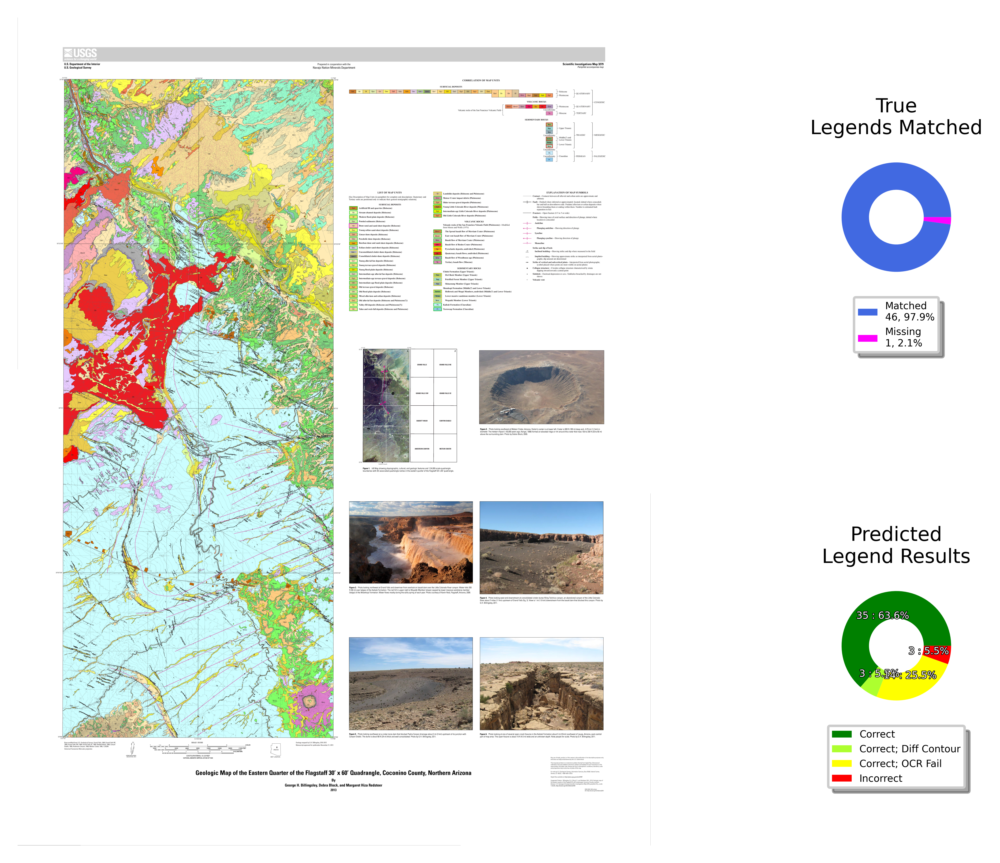

In [11]:
score_df = scoreLegendExtraction(img,truth_json, predict_json, outputDir='results/AZ_Flagstaff')

In [5]:
from sqlalchemy.engine.interfaces import Dialect
# Helper function used for visualization in the following examples
def identify_axes(ax_dict, fontsize=48):
    """
    Helper to identify the Axes in the examples below.

    Draws the label in a large font in the center of the Axes.

    Parameters
    ----------
    ax_dict : dict[str, Axes]
        Mapping between the title / label and the Axes.
    fontsize : int, optional
        How big the label should be.
    """
    kw = dict(ha="center", va="center", fontsize=fontsize, color="darkgrey")
    for k, ax in ax_dict.items():
        ax.text(0.5, 0.5, k, transform=ax.transAxes, **kw)

def autoPctText(pct, data):
    absolute = int(np.round(pct/100.*np.sum(data)))
    return f"{absolute:d} : {pct:.1f}%"

def createTruthPiePlot(ax, score_df):
    # Generate Data from score_df
    vc = score_df['Class'].value_counts()
    missing = 0
    if 'm' in vc:
        missing = vc['m']
    matched = len(score_df['Matched Label'].unique()) - missing
    data = [matched, missing]
    labels = ['Matched\n{}, {:.1f}%'.format(matched, matched*100/sum(data)), 'Missing\n{}, {:.1f}%'.format(missing, missing*100/sum(data))]

    # Plot Donut chart
    ax.set_title('True\nLegends Matched', fontsize=8)
    wedges, texts = ax.pie(data, wedgeprops=dict(width=0.5), colors=['royalblue','fuchsia']) # lightsteelblue might be okay
    ax.legend(wedges, labels, loc='upper center', bbox_to_anchor=(0.5, -0.05), fontsize=4, fancybox=True, shadow=True)

    return ax

def createPredictPiePlot(ax, score_df):
    # Generate Data from score_df
    vc = score_df['Class'].value_counts()
    data = []
    for flag in ['c','d','o','f']:
        if flag in vc:
            data.append(vc[flag])
        else:
            data.append(0)
    annotations = ['{}, {:.1f}%'.format(c, c*100/sum(data)) for c in data]
    labels = ['Correct','Correct; Diff Contour', 'Correct; OCR Fail', 'Incorrect']

    # Plot Donut chart
    ax.set_title('Predicted\nLegend Results', fontsize=8)
    wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: autoPctText(pct, data), textprops=dict(fontsize=4, color='w'), wedgeprops=dict(width=0.5), colors=['green','greenyellow','yellow','red'])
    for text in autotexts:
        text.set_path_effects([fx.Stroke(linewidth=0.5, foreground='black'), fx.Normal()])
    ax.legend(wedges, labels, loc='upper center', bbox_to_anchor=(0.5, -0.05), fontsize=4, fancybox=True, shadow=True)

    return ax

def createOverviewPlot(image, score_df):
    plot_layout = [['Main','S1'],
                   ['Main','S2']]
    fig = plt.figure(layout="constrained")
    ax = fig.subplot_mosaic(plot_layout, width_ratios=[7,1], height_ratios=[1,1])

    # Show the annotated_img on the main plot
    ax['Main'].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax['Main'].axis('off')

    createTruthPiePlot(ax['S1'], score_df)
    createPredictPiePlot(ax['S2'], score_df)

    return fig


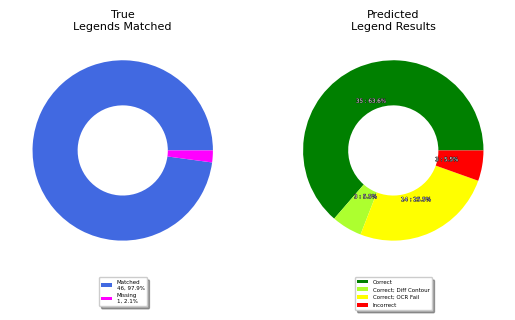

In [12]:
fig, ax = plt.subplots(1,2)
createTruthPiePlot(ax[0], score_df)
createPredictPiePlot(ax[1], score_df)
fig.show()

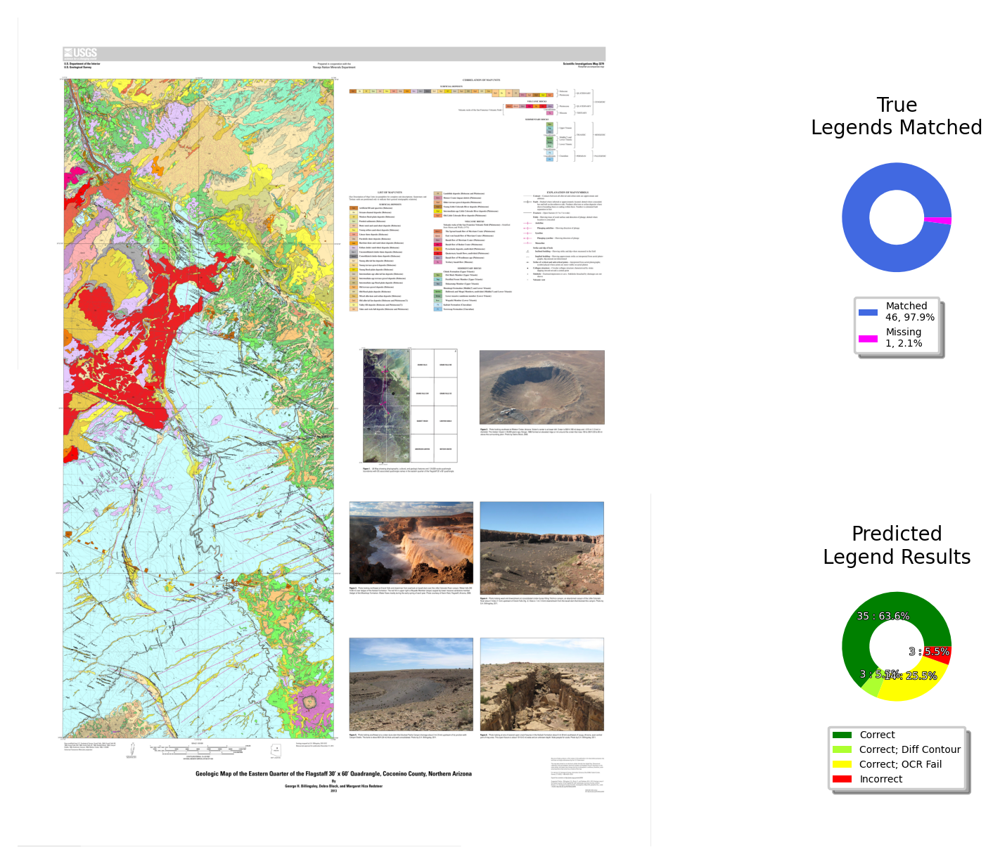

In [13]:
org_dpi = plt.rcParams['figure.dpi']
plt.rcParams['figure.dpi'] = 250 # Need to up resolution to see the full map
fig = createOverviewPlot(img, score_df)
plt.rcParams['figure.dpi'] = org_dpi

In [2]:
df = pd.read_csv('#training_Dataset_Scores.csv')

In [4]:
def createDatasetRecallPlot(ax, df):
    # Generate Data from df
    try :
        missing = df['Class'].value_counts()['m']
    except:
        missing = 0
    total_labels = 0
    for _, map_df in df.groupby('Map'):
        total_labels = total_labels + len(map_df['Matched Label'].unique())

    matched = total_labels - missing
    data = [matched, missing]
    labels = ['Matched\n{}, {:.1f}%'.format(matched, matched*100/sum(data)), 'Missing\n{}, {:.1f}%'.format(missing, missing*100/sum(data))]

    # Plot Donut chart
    ax.set_title('Recall : {:.2f}%'.format((matched/total_labels)*100))
    wedges, texts = ax.pie(data, wedgeprops=dict(width=0.5), colors=['royalblue','fuchsia']) # lightsteelblue might be okay
    ax.legend(wedges, labels, loc='center right', bbox_to_anchor=(0.05, 0.5), fancybox=True, shadow=True)

    return ax

def createDatasetPrecisionPlot(ax, df):
    # Generate Data from df
    vc = df['Class'].value_counts()
    data = []
    for flag in ['c','d','o','f']:
        if flag in vc:
            data.append(vc[flag])
        else:
            data.append(0)
    annotations = ['{}, {:.1f}%'.format(c, c*100/sum(data)) for c in data]
    labels = ['Correct','Correct; Diff Contour', 'Correct; OCR Fail', 'Incorrect']
    precision = (sum(data[0:3]) / sum(data)) *100

    # Plot Donut chart
    ax.set_title('Precision : {:.2f}%'.format(precision))
    wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: autoPctText(pct, data), textprops=dict(color='w'), wedgeprops=dict(width=0.5), colors=['green','greenyellow','yellow','red'])
    for text in autotexts:
        text.set_path_effects([fx.Stroke(linewidth=2, foreground='black'), fx.Normal()])
    ax.legend(wedges, labels, loc='center left', bbox_to_anchor=(0.95, 0.5), fancybox=True, shadow=True)

    return ax

def createAverageMapRecallPlot(ax, df):
    # Generate Data from df
    recalls = []
    for _, map_df in df.groupby('Map'):
        missing = 0
        try :
            missing = map_df['Class'].value_counts()['m']
        except:
            pass
        matched = len(map_df['Matched Label'].unique()) - missing
        recalls.append(matched/(matched+missing))

    avg_recall = sum(recalls)/len(recalls)
    data = [avg_recall,1-avg_recall]

    # Plot Donut chart
    ax.set_title('Average Map Recall : {:.2f}%'.format(avg_recall*100))
    wedges, texts = ax.pie(data, wedgeprops=dict(width=0.5), colors=['royalblue','fuchsia']) # lightsteelblue might be okay

    return ax

def createAverageMapPrecisionPlot(ax, df):
    # Generate Data from score_df
    precisions = []
    for map, map_df in df.groupby('Map'):
        if 'geo_mosaic' in map:
            continue
        vc = map_df['Class'].value_counts()
        data = []
        for flag in ['c','d','o','f']:
            if flag in vc:
                data.append(vc[flag])
            else:
                data.append(0)
        if (sum(data) == 0):
            continue
        precisions.append(sum(data[0:3])/sum(data))

    avg_precision = sum(precisions)/len(precisions)
    data = [avg_precision,1-avg_precision]

    # Plot Donut chart
    ax.set_title('Average Map Precision : {:.2f}%'.format(avg_precision*100))
    wedges, texts = ax.pie(data, wedgeprops=dict(width=0.5), colors=['green','red']) # lightsteelblue might be okay

    return ax

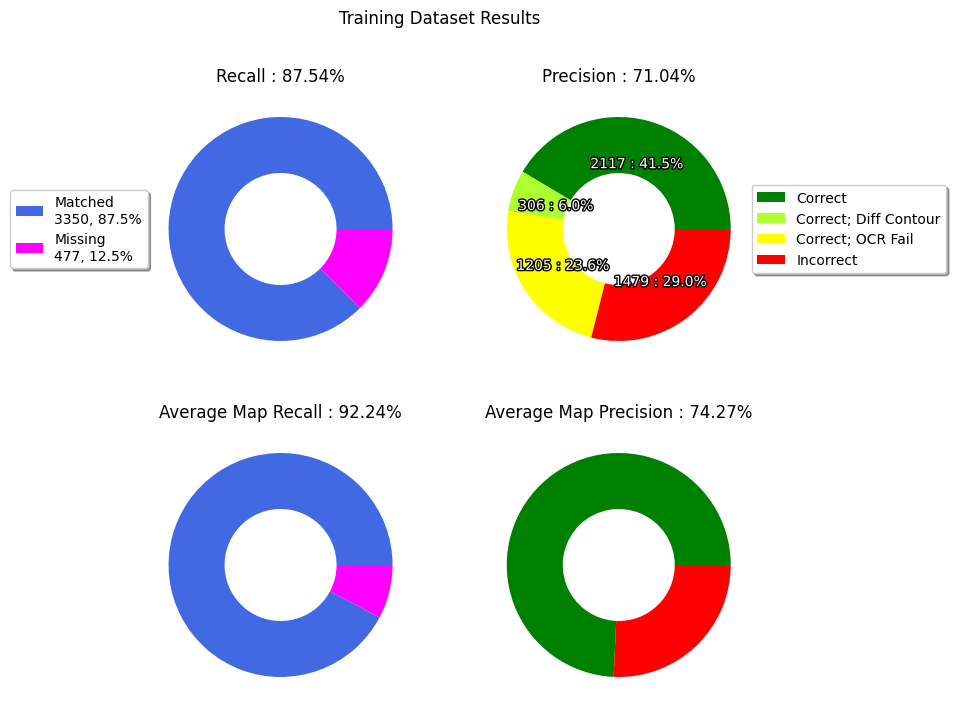

In [6]:
fig, ax = plt.subplots(2,2, figsize=(8,8))
fig.suptitle('Training Dataset Results')
createDatasetRecallPlot(ax[0,0], df)
createDatasetPrecisionPlot(ax[0,1], df)
createAverageMapRecallPlot(ax[1,0], df)
createAverageMapPrecisionPlot(ax[1,1], df)
fig.show()